In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
#https://scipython.com/blog/quadtrees-2-implementation-in-python/
#https://pydoc.net/openslide-python/1.1.1/openslide/

import numpy as np
import openslide
from probreg import cpd
from probreg import transformation as tf
import cv2
from PIL import Image
from pathlib import Path
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches

from sklearn.neighbors import LocalOutlierFactor

In [3]:
from registration_tree import Rect, QuadTree

In [4]:
df = pd.read_pickle("../../SDATA/Statistics/SDATA_Final_Annotations.pkl")
df = df[df["image_name"] == "24_EIPH_576255 Berliner Blau.svs"]

df["x1"] = [vector['x1'] if type(vector) is dict else 0 for vector in df["vector"]]
df["y1"] = [vector['y1'] if type(vector) is dict else 0 for vector in df["vector"]]

df["x2"] = [vector['x2'] if type(vector) is dict else 0 for vector in df["vector"]]
df["y2"] = [vector['y2'] if type(vector) is dict else 0 for vector in df["vector"]]

df["center_x"] = [x1 + ((x2-x1) / 2) for x1, x2 in zip(df["x1"], df["x2"])]
df["center_y"] = [y1 + ((y2-y1) / 2) for y1, y2 in zip(df["y1"], df["y2"])]

df["anno_width"] = [x2-x1 for x1, x2 in zip(df["x1"], df["x2"])]
df["anno_height"]= [y2-y1 for y1, y2 in zip(df["y1"], df["y2"])]

df = df.sort_values(by=["grade"], ascending=False)
df.head()

,id,image_id,image_set,species,image_name,image_type,grade,vector,user_id,deleted,...,data_set_name,version,x1,y1,x2,y2,center_x,center_y,anno_width,anno_height
unique_identifier,,,,,,,,,,,,,,,,,,,,,
0412b6f8-b13d-4517-ba6f-3e03525b423d,2530043,5180,268,equine,24_EIPH_576255 Berliner Blau.svs,Prussian,4,"{'x1': 24346, 'x2': 24527, 'y1': 15610, 'y2': ...",1,False,...,SDATA,Density,24346,15610,24527,15793,24436.5,15701.5,181,183
8daed17b-dd34-42fe-aa38-75cb0a0c62c2,2529981,5180,268,equine,24_EIPH_576255 Berliner Blau.svs,Prussian,4,"{'x1': 21320, 'x2': 21472, 'y1': 11489, 'y2': ...",1,False,...,SDATA,Density,21320,11489,21472,11642,21396.0,11565.5,152,153
bf582d83-dc00-4cb7-b74d-f78ce8d7c631,2530008,5180,268,equine,24_EIPH_576255 Berliner Blau.svs,Prussian,4,"{'x1': 19562, 'x2': 19682, 'y1': 27214, 'y2': ...",1,False,...,SDATA,Density,19562,27214,19682,27334,19622.0,27274.0,120,120
8e891521-ed03-4637-bf24-0a5c7baf8094,2530002,5180,268,equine,24_EIPH_576255 Berliner Blau.svs,Prussian,4,"{'x1': 15240, 'x2': 15331, 'y1': 7919, 'y2': 8...",1,False,...,SDATA,Density,15240,7919,15331,8010,15285.5,7964.5,91,91
2387348e-509d-4c59-86a6-2670a84a634e,2530000,5180,268,equine,24_EIPH_576255 Berliner Blau.svs,Prussian,4,"{'x1': 26904, 'x2': 27019, 'y1': 12569, 'y2': ...",1,False,...,SDATA,Density,26904,12569,27019,12684,26961.5,12626.5,115,115


In [5]:
annos = np.array(df[["center_x", "center_y", "anno_width", "anno_height"]])
annos[:5]

array([[24436.5, 15701.5,   181. ,   183. ],
       [21396. , 11565.5,   152. ,   153. ],
       [19622. , 27274. ,   120. ,   120. ],
       [15285.5,  7964.5,    91. ,    91. ],
       [26961.5, 12626.5,   115. ,   115. ]])

In [9]:
file_scanner = {
    "24_EIPH_576255 Berliner Blau.svs": {"Name": "Aperio", "slide": None, "thumbnail": None},
    "Z_BB_576255_1.tif": {"Name":"AxioScan", "slide": None, "thumbnail": None},
    "N2_BB_576255_1.ndpi": {"Name": "NanoZoomer2.0HT", "slide": None, "thumbnail": None},
    "N1_BB_576255_1.ndpi": {"Name": "NanoZoomerS210", "slide": None, "thumbnail": None},
}

#source_slide = openslide.OpenSlide(f'../Slides/Aperio/24_EIPH_576255 Berliner Blau.svs')
#target_slide = openslide.OpenSlide(f'../Slides/NanoZoomer2.0HT/N2_BB_576255_1.ndpi')

source_slide = openslide.OpenSlide(f'D:/Datasets/ColonCancer/SingleSlide/IHC/CRC-AI-15 X40 IHC.tif')
target_slide = openslide.OpenSlide(f'D:/Datasets/ColonCancer/SingleSlide/HE/CRC-AI-15 X40.tif')

source_dimension = Rect.create(Rect, 0, 0, source_slide.dimensions[0], source_slide.dimensions[1])
target_dimension = Rect.create(Rect, 0, 0, target_slide.dimensions[0], target_slide.dimensions[1])


In [11]:
%%time

parameter = {
    # feature extractor parameters
    "point_extractor": "sift",  #orb , sift
    "maxFeatures": 1024, 
    "crossCheck": False, 
    "flann": False,
    "ratio": 0.7, 
    "use_gray": True,

    # QTree parameter 
    "homography": True,
    "filter_outliner": False,
    "debug": True,
    "target_depth": 1,
    "run_async": False,
    "thumbnail_size": (1024, 1024)
}

qtree = QuadTree(source_dimension, source_slide, target_dimension, target_slide, **parameter)
print(qtree)

Source: CRC-AI-15 X40 IHC 
Target: CRC-AI-15 X40 
Source: (0.00, 0.00, 84048.00, 76976.00) Target: (0.00, 0.00, 86256.00, 86432.00)
x: [1.000, 0.007, -962.528], y: [-0.010, 1.002, -977.771]] error: 5969.984
nw: Source: (0.00, 0.00, 42024.00, 38488.00) Target: (-0.97, -0.27, 41328.97, 37186.27)
  x: [0.999, 0.008, -976.201], y: [-0.007, 1.003, -979.220]] error: 392.022
ne: Source: (42024.00, 0.00, 84048.00, 38488.00) Target: (41329.71, -0.27, 83622.19, 37186.27)
  x: [0.833, -0.065, 2871.327], y: [-0.057, 0.792, 2343.316]] error: 5526.754
se: Source: (42024.00, 38488.00, 84048.00, 76976.00) Target: (41329.71, 37186.39, 83622.19, 75350.70)
  x: [0.997, 0.006, 80.455], y: [-0.010, 0.996, 538.717]] error: 532.387
sw: Source: (0.00, 38488.00, 42024.00, 76976.00) Target: (-0.97, 37186.39, 41328.97, 75350.70)
  x: [0.998, 0.007, -660.906], y: [-0.007, 1.006, 398.326]] error: 380.713
Wall time: 8.34 s


In [20]:
%%time

openslide.OpenSlide(f'D:/Datasets/ColonCancer/SingleSlide/IHC/CRC-AI-15 X40 IHC.tif')

Wall time: 400 ms


OpenSlide('D:/Datasets/ColonCancer/SingleSlide/IHC/CRC-AI-15 X40 IHC.tif')

In [13]:
%%prun -s cumulative -q -l 20 -T prun0

qtree = QuadTree(source_dimension, source_slide, target_dimension, target_slide, target_depth=1, debug=True)

 
*** Profile printout saved to text file 'prun0'. 


In [14]:
print(open('prun0', 'r').read())

         15363 function calls (15353 primitive calls) in 35.747 seconds

   Ordered by: cumulative time
   List reduced from 115 to 20 due to restriction <20>

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        1    0.000    0.000   35.747   35.747 {built-in method builtins.exec}
        1    0.000    0.000   35.747   35.747 <string>:1(<module>)
      5/1    0.064    0.013   35.747   35.747 registration_tree.py:109(__init__)
       10    0.001    0.000   33.598    3.360 registration_tree.py:777(get_region_thumbnail)
        1    0.000    0.000   32.535   32.535 registration_tree.py:255(divide)
       10    0.000    0.000   30.484    3.048 __init__.py:212(read_region)
       10   30.346    3.035   30.484    3.048 lowlevel.py:248(read_region)
       10    0.055    0.006    2.287    0.229 Image.py:2261(thumbnail)
       10    0.000    0.000    2.232    0.223 Image.py:1838(resize)
       10    2.232    0.223    2.232    0.223 {method 'resize' of 'ImagingCore' o

(<Figure size 720x720 with 16 Axes>,
 [(<Figure size 720x720 with 16 Axes>, None),
  (<Figure size 720x720 with 16 Axes>, None),
  (<Figure size 720x720 with 16 Axes>, None),
  (<Figure size 720x720 with 16 Axes>, None)])

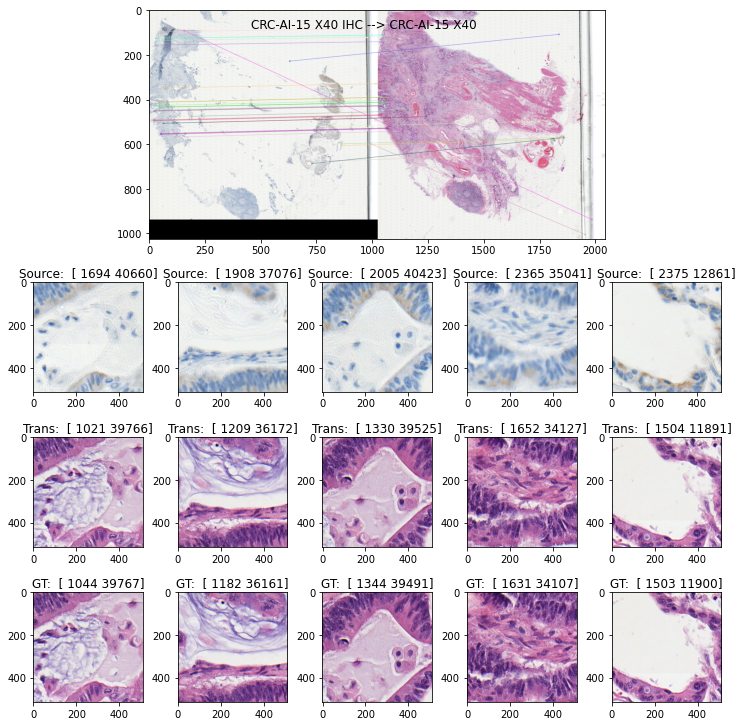

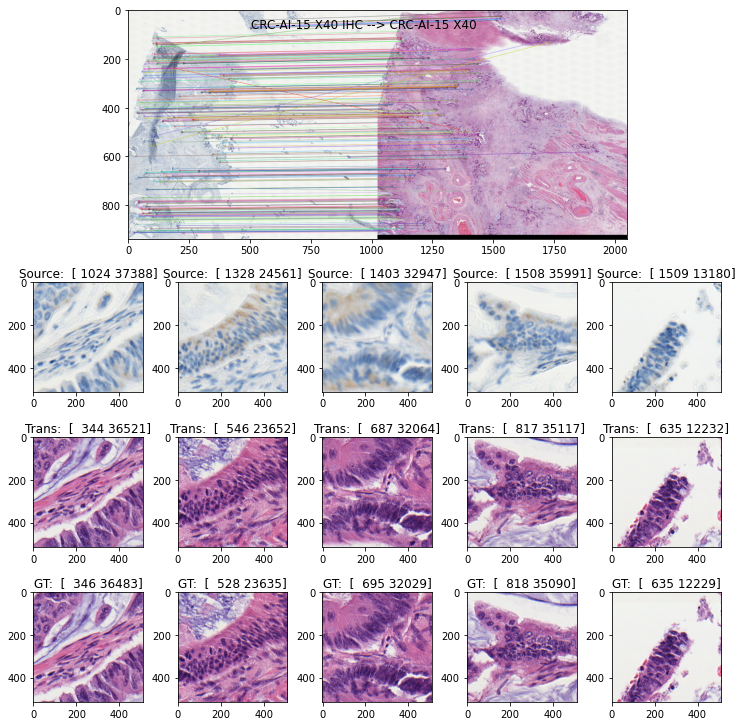

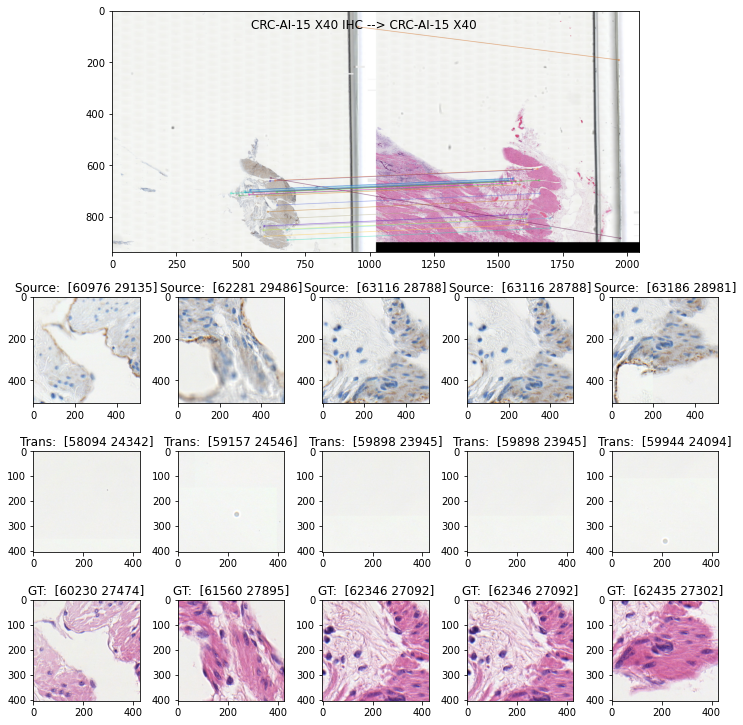

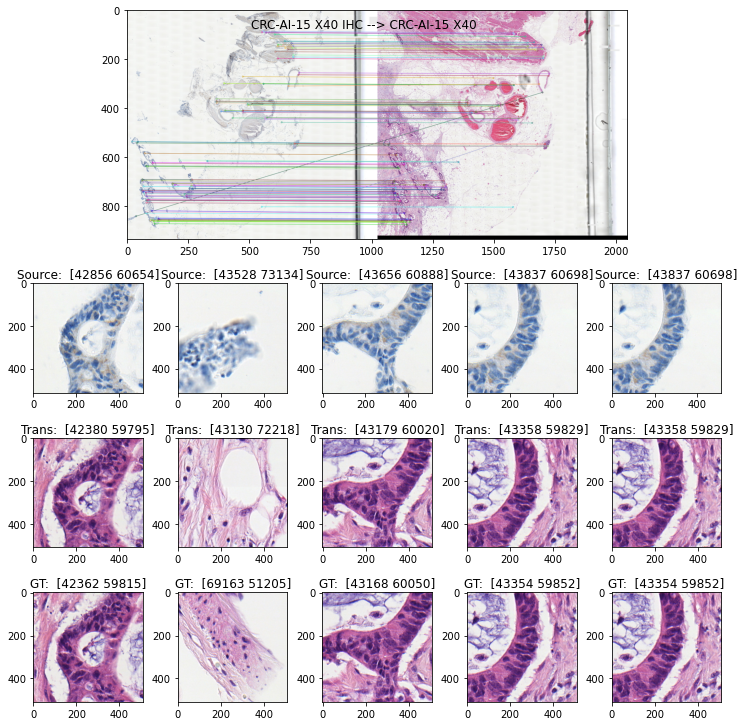

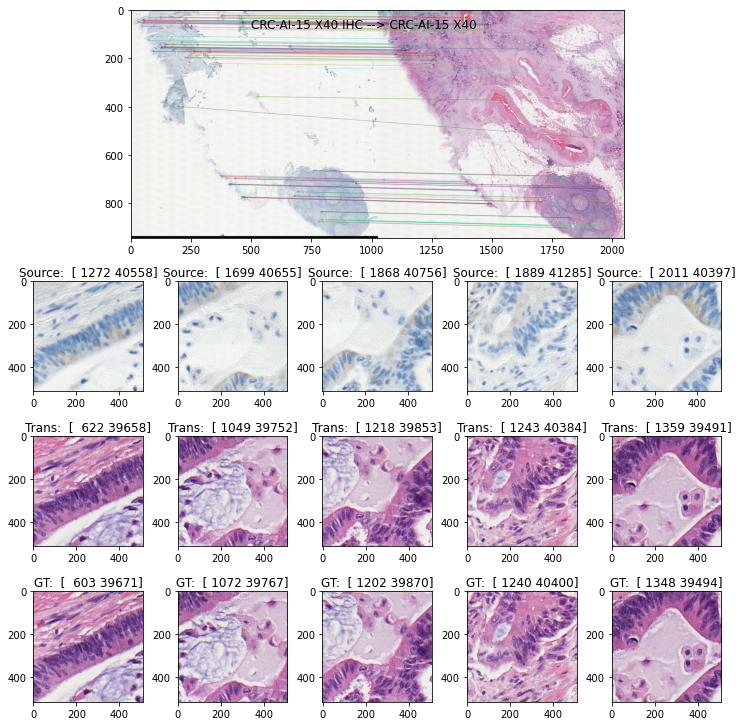

In [12]:
qtree.draw_feature_points(num_sub_pic=5, figsize=(10, 10)) # num_sub_pic=2, figsize=(48, 48)

(<Figure size 1152x1152 with 11 Axes>, None)

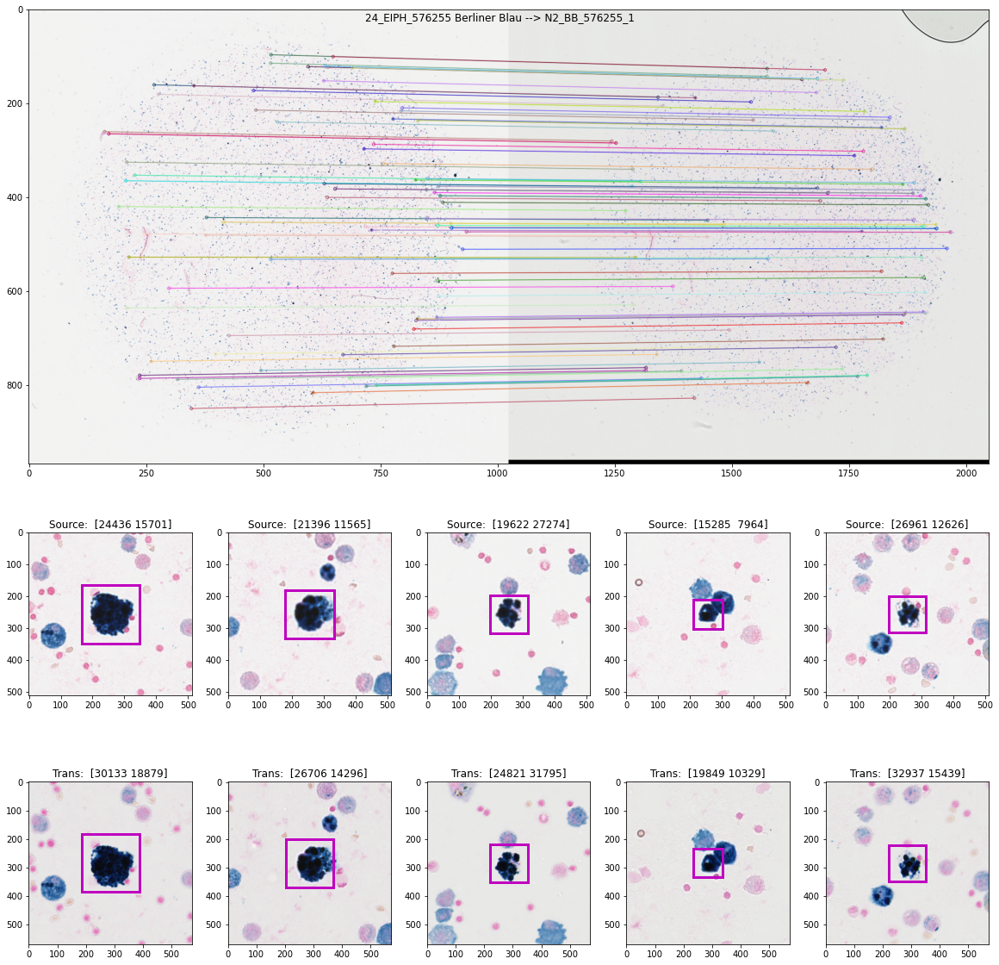

In [9]:
qtree.draw_annotations(annos)

In [22]:
%%time

parameter.update({"target_depth": 1})
qtree = QuadTree(source_dimension, source_slide, target_dimension, target_slide, **parameter)
print(qtree)

Source: 24_EIPH_576255 Berliner Blau 
Target: N2_BB_576255_1 
Source: (0.00, 0.00, 34200.00, 32356.00) Target: (0.00, 0.00, 40960.00, 38400.00)
x: [1.118, 0.006, 2703.905], y: [-0.007, 1.113, 1567.115]] error: 6.861
nw: Source: (0.00, 0.00, 17100.00, 16178.00) Target: (2703.43, 1566.50, 21930.38, 19459.73)
  x: [1.119, 0.006, 14.318], y: [-0.007, 1.115, -3.955]] error: 7.651
ne: Source: (17100.00, 0.00, 34200.00, 16178.00) Target: (21930.27, 1566.50, 40959.42, 19459.73)
  x: [1.119, 0.006, -91.994], y: [-0.007, 1.114, -115.703]] error: 3.663
se: Source: (17100.00, 16178.00, 34200.00, 32356.00) Target: (21930.27, 19459.73, 40959.42, 37352.95)
  x: [1.118, 0.006, 4.746], y: [-0.007, 1.114, 11.892]] error: 7.628
sw: Source: (0.00, 16178.00, 17100.00, 32356.00) Target: (2703.43, 19459.73, 21930.38, 37352.95)
  x: [1.119, 0.006, 104.681], y: [-0.006, 1.114, 121.216]] error: 3.139
Wall time: 24.2 s


(<Figure size 1152x1152 with 11 Axes>,
 [(<Figure size 1152x1152 with 11 Axes>, None),
  (<Figure size 1152x1152 with 11 Axes>, None),
  (<Figure size 1152x1152 with 11 Axes>, None),
  (<Figure size 1152x1152 with 11 Axes>, None)])

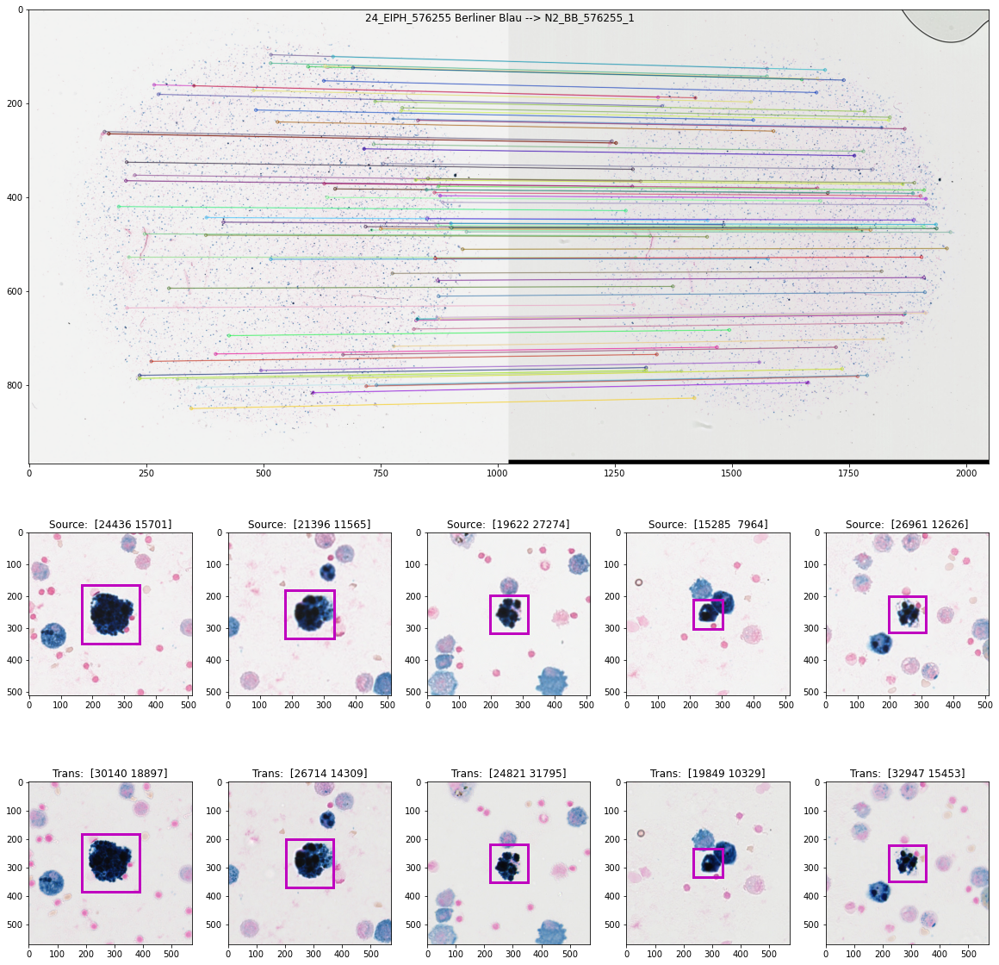

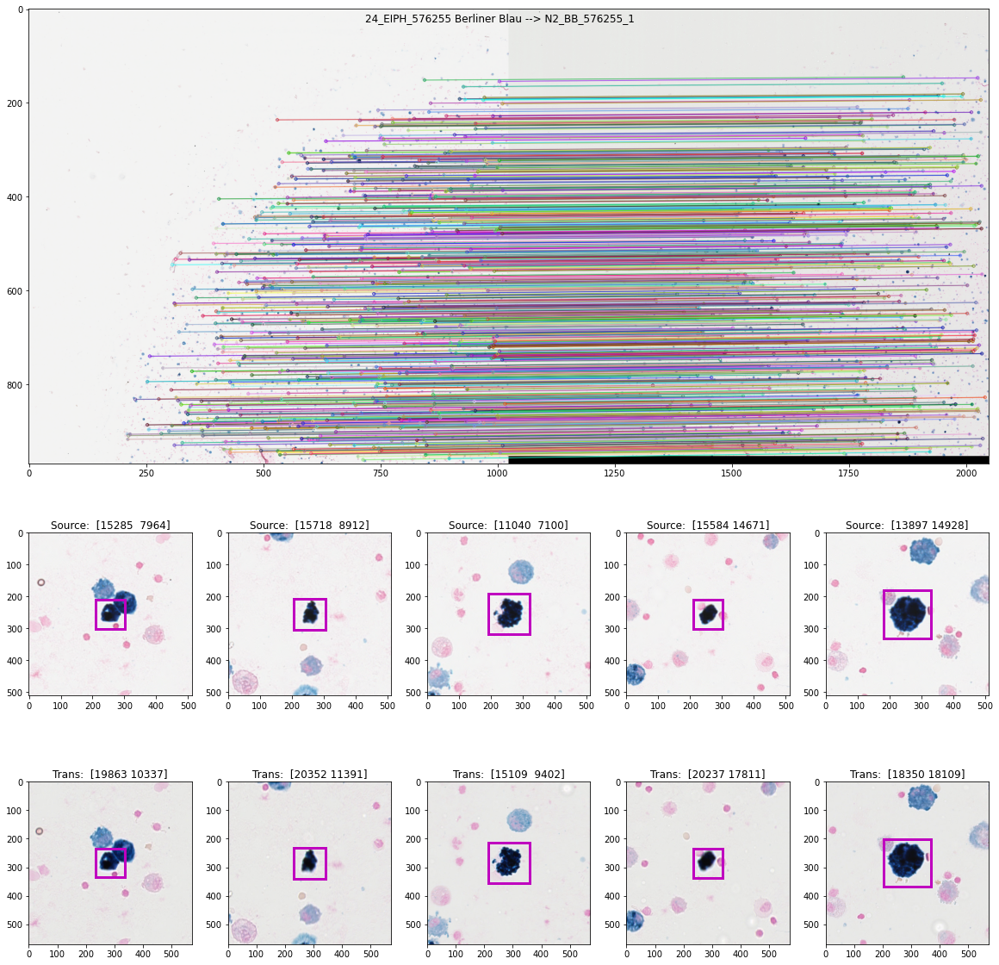

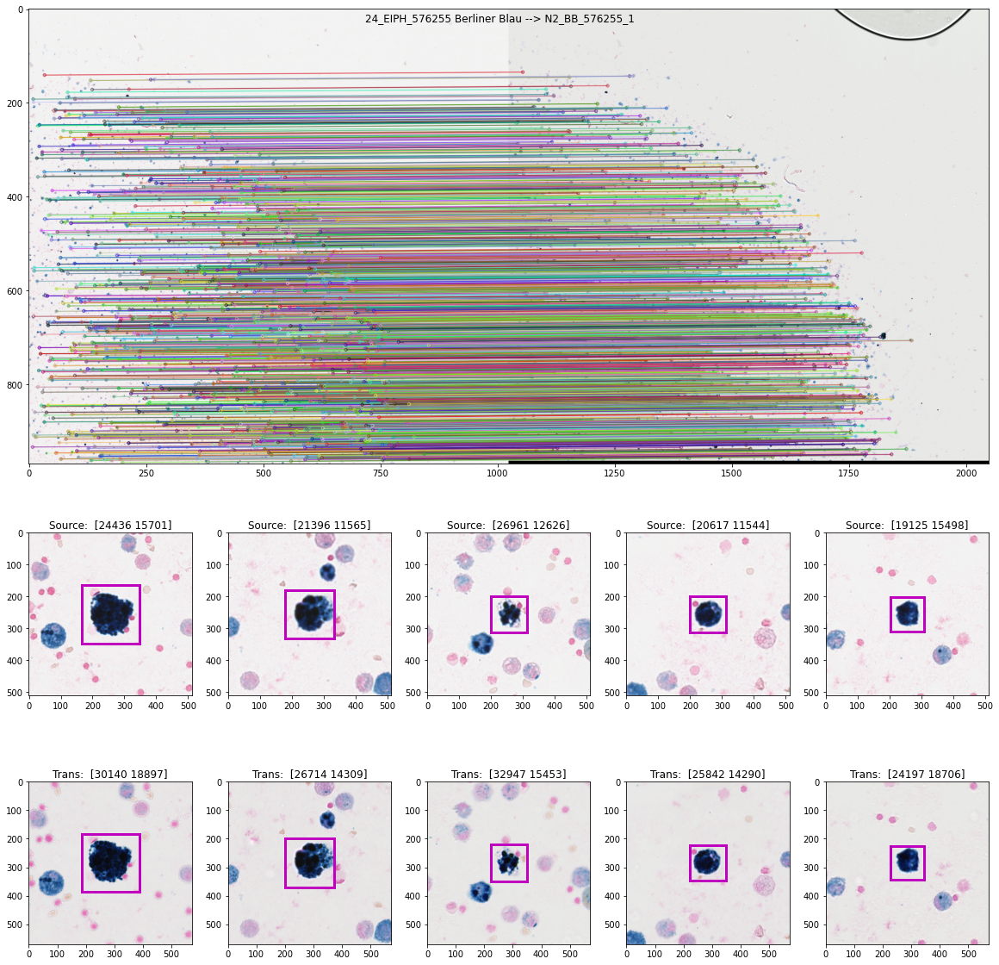

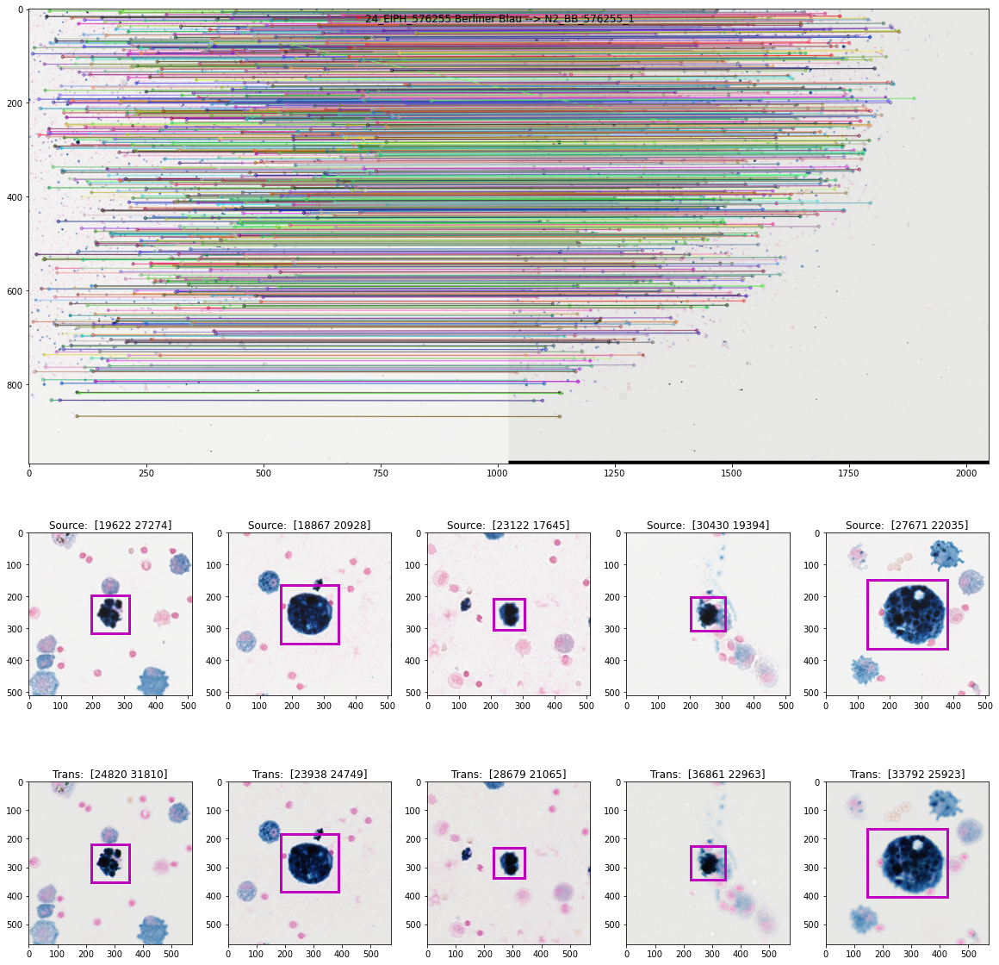

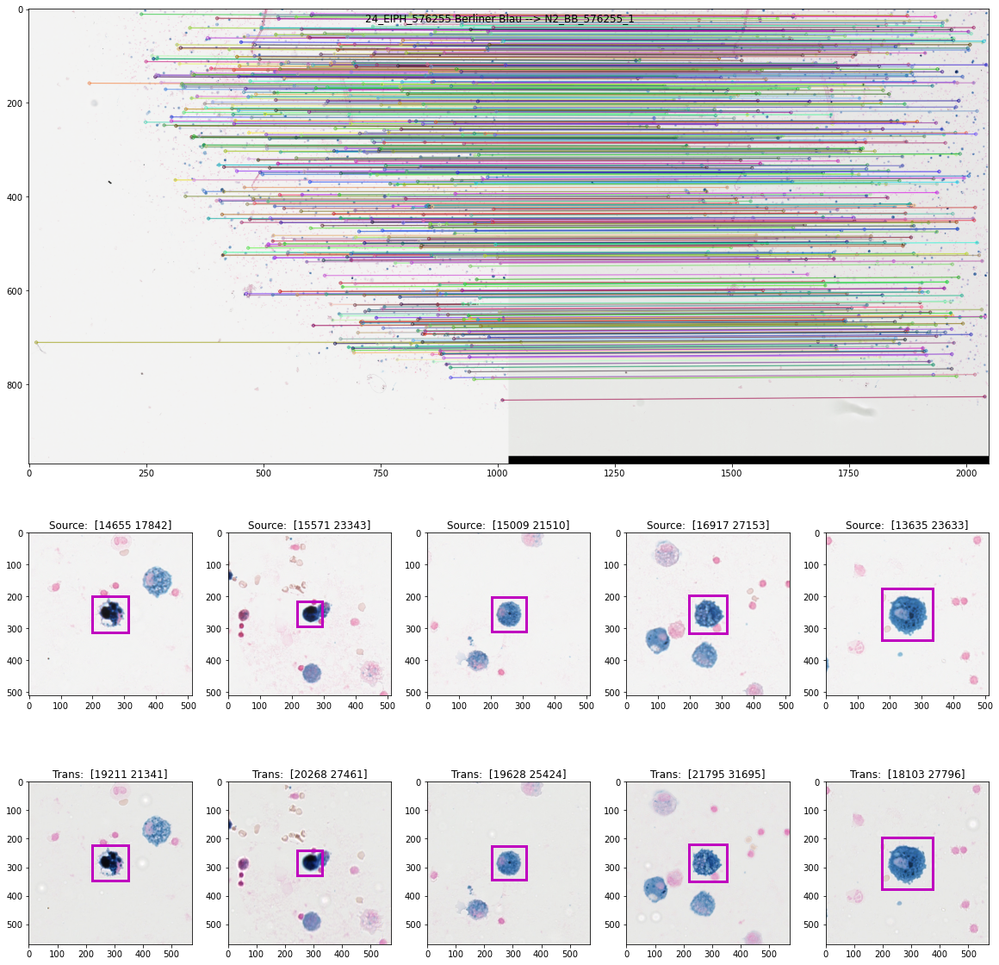

In [23]:
qtree.draw_annotations(annos)

(<Figure size 1152x1152 with 16 Axes>,
 [(<Figure size 1152x1152 with 16 Axes>, None),
  (<Figure size 1152x1152 with 16 Axes>, None),
  (<Figure size 1152x1152 with 16 Axes>, None),
  (<Figure size 1152x1152 with 16 Axes>, None)])

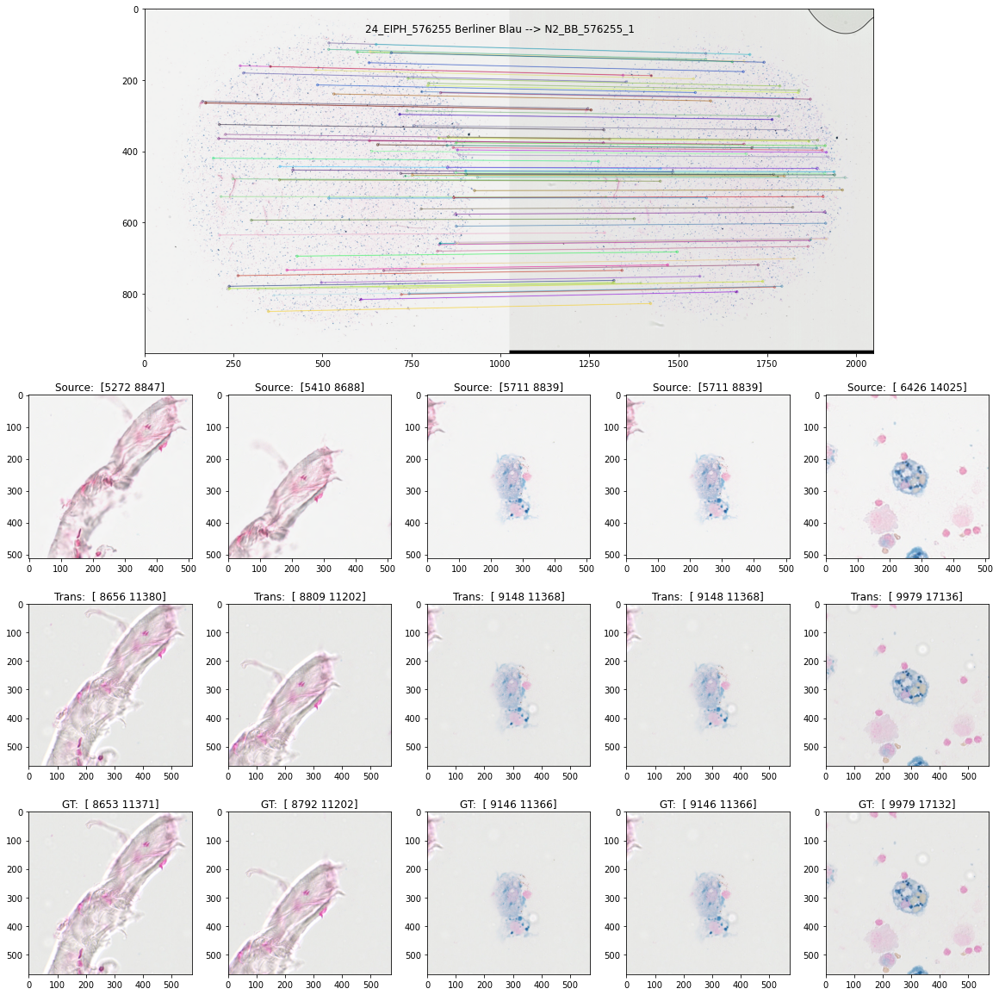

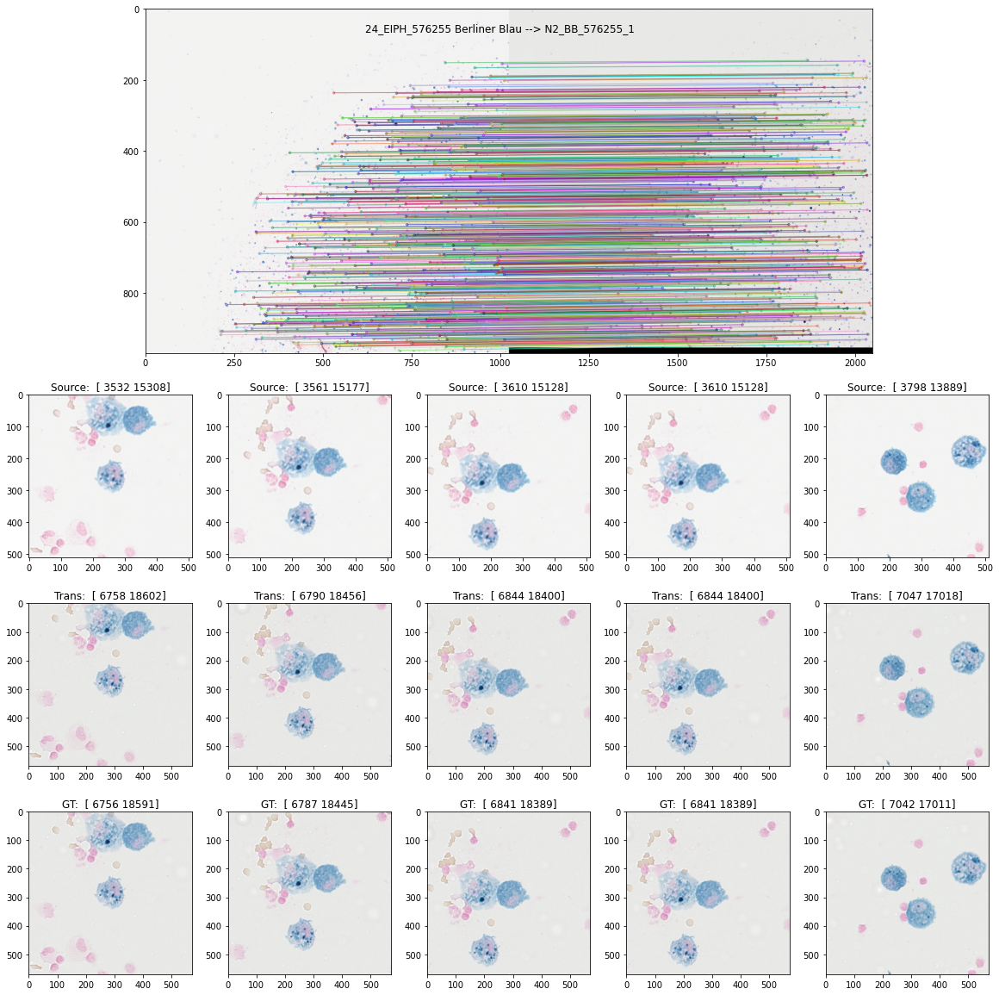

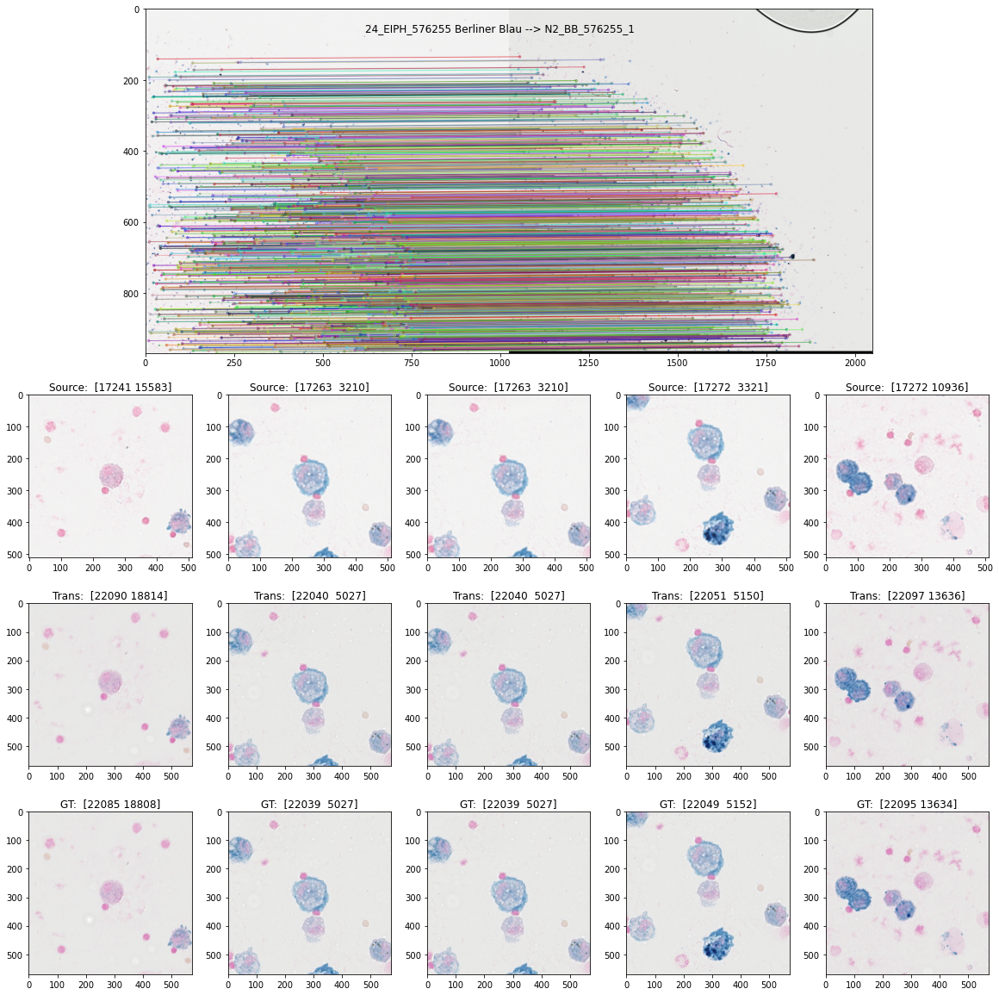

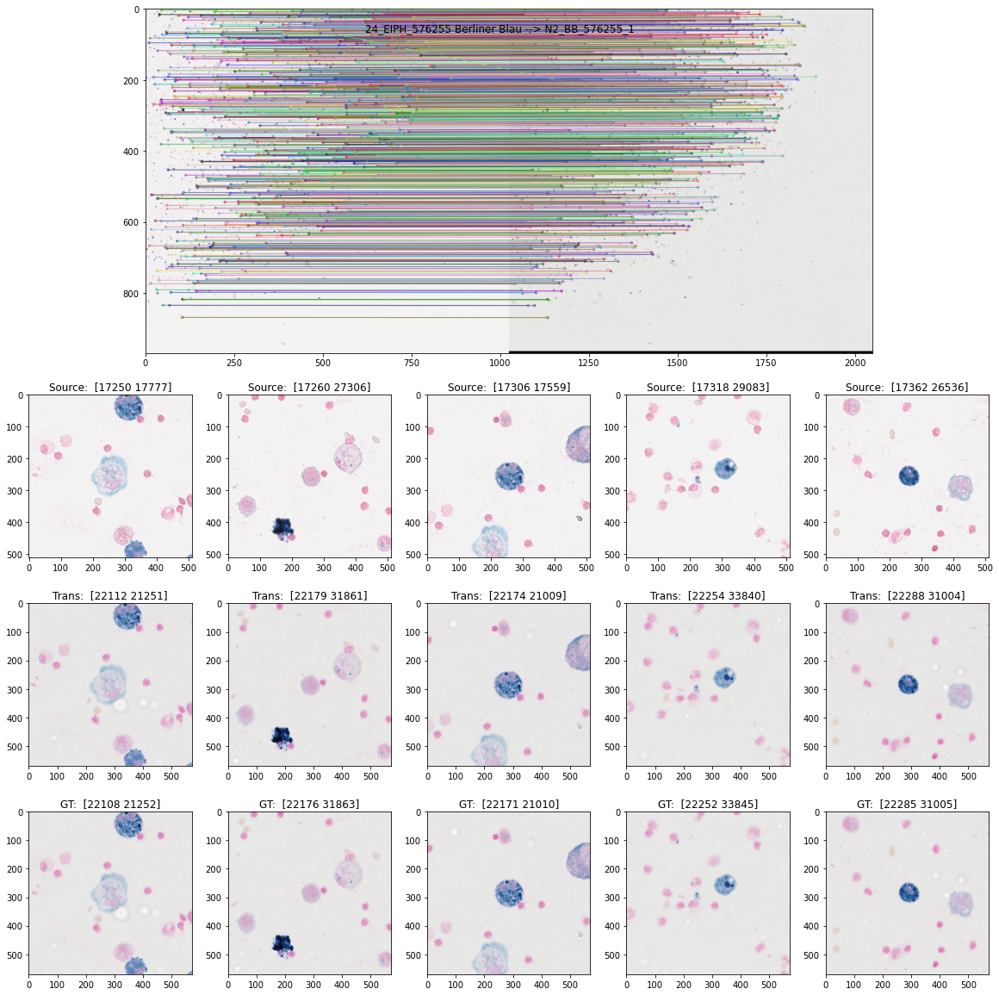

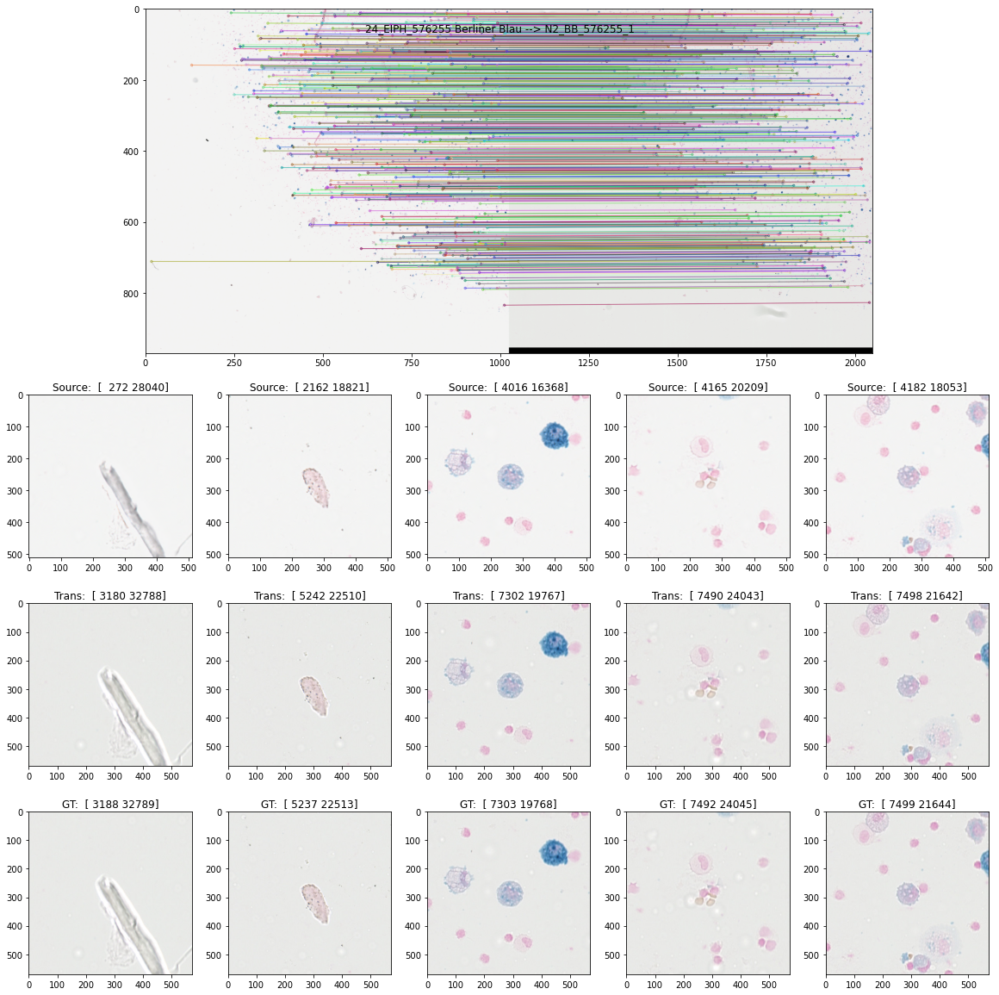

In [26]:
qtree.draw_feature_points()